# Look at the overview scans
Let's see what we did there.

In [1]:
import platform
import glob
import os
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib.patches
import seaborn
import pandas
import numpy
from tqdm import notebook
from itkwidgets import view  # 3d viewer
import imageio
import dask
import dask.array as da
import dask_image.imread
from distributed import Client
client = Client(processes=False,
#                 local_directory='F:\tmp',
#                 n_workers=32,
#                 silence_logs=True
               )
# Then go to http://localhost:8787/status
from numcodecs import Blosc

In [2]:
print('You can seee what DASK is doing at "http://localhost:%s/status"' % client.scheduler_info()['services']['dashboard'])

You can seee what DASK is doing at "http://localhost:8787/status"


In [3]:
# # Ignore warnings in the notebook
# import warnings
# warnings.filterwarnings("ignore")

In [4]:
# Set up figure defaults
plt.rc('image', cmap='gray', interpolation='nearest')  # Display all images in b&w and with 'nearest' interpolation
plt.rcParams['figure.figsize'] = (16, 9)  # Size up figures a bit

In [5]:
# Setup scale bar defaults
plt.rcParams['scalebar.location'] = 'lower right'
plt.rcParams['scalebar.frameon'] = False
plt.rcParams['scalebar.color'] = 'white'

In [219]:
# Display all plots identically
lines = 5
# And then do something like
# plt.subplot(lines, numpy.ceil(len(Data) / float(lines)), c + 1)

In [7]:
# Different locations if running either on Linux or Windows
FastSSD = False
# to speed things up significantly
if 'Linux' in platform.system():
    if FastSSD:
        BasePath = os.path.join(os.sep, 'media', 'habi', 'Fast_SSD')
    else:
        BasePath = os.path.join(os.sep, 'home', 'habi', '1272')
else:
    if FastSSD:
        BasePath = os.path.join('F:\\')
    else:
        if 'anaklin' in platform.node():
            BasePath = os.path.join('S:\\')
        else:
            BasePath = os.path.join('D:\\Results')
Root = os.path.join(BasePath, 'Chondrules Space Yogita')
print('We are loading all the data from %s' % Root)

We are loading all the data from D:\Results\Chondrules Space Yogita


In [8]:
def get_pixelsize(logfile):
    """Get the pixel size from the scan log file"""
    with open(logfile, 'r') as f:
        for line in f:
            if 'Image Pixel' in line and 'Scaled' not in line:
                pixelsize = float(line.split('=')[1])
    return(pixelsize)

In [9]:
def get_filter(logfile):
    """Get the filter we used whole scanning from the scan log file"""
    with open(logfile, 'r') as f:
        for line in f:
            if 'Filter=' in line:
                whichfilter = line.split('=')[1].strip()
    return(whichfilter)

In [10]:
def get_exposuretime(logfile):
    """Get the exposure time size from the scan log file"""
    with open(logfile, 'r') as f:
        for line in f:
            if 'Exposure' in line:
                exposuretime = int(line.split('=')[1])
    return(exposuretime)

In [11]:
def get_ringartefact(logfile):
    """Get the ring artefact correction from the  scan log file"""
    ringartefactcorrection = numpy.nan
    with open(logfile, 'r') as f:
        for line in f:
            if 'Ring Artifact' in line:
                ringartefactcorrection = int(line.split('=')[1])
    return(ringartefactcorrection)

In [12]:
def get_reconstruction_grayvalue(logfile):
    """How did we map the brightness of the reconstructions?"""
    grayvalue = numpy.nan
    with open(logfile, 'r') as f:
        for line in f:
            if 'Maximum for' in line:
                grayvalue = float(line.split('=')[1])
    return(grayvalue)

In [13]:
def get_beamhardening(logfile):
    """Get the beamhardening correction from the  scan log file"""
    beamhardeningcorrection = numpy.nan
    with open(logfile, 'r') as f:
        for line in f:
            if 'Hardening' in line:
                beamhardeningcorrection = int(line.split('=')[1])
    return(beamhardeningcorrection)

In [194]:
# Make us a dataframe for saving all that we need
Data = pandas.DataFrame()

In [195]:
# Get *all* projection log files
Data['LogFile'] = [f for f in sorted(glob.glob(os.path.join(Root, '**', '*.log'), recursive=True))]

In [196]:
# Get all folders
Data['Folder'] = [os.path.dirname(f) for f in Data['LogFile']]

In [197]:
# Get the necessary information
Data['Sample'] = [(f[len(Root)+1:]).split(os.sep)[0] for f in Data['Folder']]
Data['Scan'] = [(f[len(Root)+1:]).split(os.sep)[1] for f in Data['Folder']]
Data['SampleNameLength'] = [len(sn) for sn in Data['Sample']]
Data['ScanNameLength'] = [len(sn) for sn in Data['Scan']]

In [198]:
# Remove 'rec' from 'Scan', since we don't need that
Data['Scan'] = ['' if 'rec' in s else s for s in Data['Scan']]

In [199]:
print('We found %s log files to work with' % len(Data))

We found 51 log files to work with


In [200]:
# Get parameters to doublecheck from logfiles
Data['Voxelsize'] = [get_pixelsize(log) for log in Data['LogFile']]
Data['Filter'] = [get_filter(log) for log in Data['LogFile']]
Data['Exposuretime'] = [get_exposuretime(log) for log in Data['LogFile']]
Data['Grayvalue'] = [get_reconstruction_grayvalue(log) for log in Data['LogFile']]
Data['RingartefactCorrection'] = [get_ringartefact(log) for log in Data['LogFile']]
Data['BeamHardeninCorrection'] = [get_beamhardening(log) for log in Data['LogFile']]

In [201]:
# Check for reconstructions
for c, row in Data.iterrows():
    if not len(glob.glob(os.path.join(os.path.dirname(row.Folder), '*rec*', '*.*'))):
        print('%s contains *no* reconstruction folder (or only an empty one)' % os.path.join(row.Sample, 'rec'))

In [202]:
# Get the file names of the reconstructions
Data['Reconstructions'] = [sorted(glob.glob(os.path.join(os.path.dirname(lf),
                                                         '*.png'))) for lf in Data['LogFile']]
Data['Number of reconstructions'] = [len(r) for r in Data.Reconstructions]

In [203]:
# Drop 'proj' folders and samples which have not been reconstructed yet
# Based on https://stackoverflow.com/a/13851602
for c, sample in Data[Data['Number of reconstructions'] == 0].iterrows():
    if not 'proj' in sample.LogFile:
        print('%s is empty' % os.path.dirname(sample.LogFile))
Data = Data[Data['Number of reconstructions'] > 0]
Data.reset_index(drop=True, inplace=True)
print('We have %s folders with reconstructions' % (len(Data)))

We have 25 folders with reconstructions


In [224]:
# Did we reconstruct them equally?
Data[['Sample',
      'Scan',
      'Voxelsize',
      'Filter',
      'Exposuretime',
      'Grayvalue',
      'RingartefactCorrection',
      'BeamHardeninCorrection']].to_excel('ScanParameters.xlsx')

In [204]:
# Did we reconstruct them equally?
Data[['Sample', 'Scan',  'Voxelsize', 'Filter', 'Exposuretime', 'Grayvalue', 'RingartefactCorrection', 'BeamHardeninCorrection']]

,Sample,Scan,Voxelsize,Filter,Exposuretime,Grayvalue,RingartefactCorrection,BeamHardeninCorrection
0,All-200813,,1.650005,Al 0.5mm,5850,1.000000,7,50
1,All-CH2,1umAl0.5Cu0.038,0.999977,Al 0.5 + Cu 0.038,6942,0.236075,13,100
2,All-CH2,1umAl0.5,0.999977,Al 0.5mm,4438,0.836260,13,100
3,All-CH2,QuickOverview,3.000093,Al 0.5mm,1516,0.331616,13,100
4,Batch_Allende,,1.650005,Al 0.5mm,6500,0.684017,14,10
5,LAC41,QuickOverview,1.249917,Al 0.5mm,1950,1.198975,13,100
6,LaC43,0.5umAl0.25mm,0.500002,Al 0.25mm,3854,1.665872,10,100
7,LaC43,QuickOverview,1.500006,Al 0.5mm,1950,0.758062,13,100
8,NINQ2,,1.650005,Al 0.5mm,5265,0.873326,14,0
9,NINQ3,,1.650005,Al 0.5mm,5265,0.976663,14,0


In [205]:
print(Data['Voxelsize'].unique())
print(Data['Filter'].unique())
print(Data['RingartefactCorrection'].unique())
print(Data['BeamHardeninCorrection'].unique())

[1.650005 0.999977 3.000093 1.249917 0.500002 1.500006]
['Al 0.5mm' 'Al 0.5 + Cu 0.038' 'Al 0.25mm']
[ 7 13 14 10]
[ 50 100  10   0]


In [207]:
# Display some info
for c, row in Data.iterrows():
    print('%02s/%s: %s has %03s reconstructions' % (c + 1,
                                                    len(Data),
                                                    row['Sample'].rjust(Data['SampleNameLength'].max()),
                                                    row['Number of reconstructions']), end=' ')
    if row['Scan']:
        print('in %s' %row['Scan'], end='\n')
    else:
        print(end='\n')

 1/25:    All-200813 has 1882 reconstructions 
 2/25:       All-CH2 has 1781 reconstructions in 1umAl0.5Cu0.038
 3/25:       All-CH2 has 1723 reconstructions in 1umAl0.5
 4/25:       All-CH2 has 571 reconstructions in QuickOverview
 5/25: Batch_Allende has 2921 reconstructions 
 6/25:         LAC41 has 316 reconstructions in QuickOverview
 7/25:         LaC43 has 611 reconstructions in 0.5umAl0.25mm
 8/25:         LaC43 has 230 reconstructions in QuickOverview
 9/25:         NINQ2 has 1751 reconstructions 
10/25:         NINQ3 has 835 reconstructions 
11/25:          NINQ has 2321 reconstructions 
12/25:    NWA-200813 has 2286 reconstructions 
13/25:     NWA11241A has 2133 reconstructions 
14/25:     NWA11241B has 2662 reconstructions 
15/25:     NWA11241C has 2292 reconstructions 
16/25:      NWA8276A has 2321 reconstructions 
17/25:      NWA8276B has 2377 reconstructions 
18/25:      NWA8276C has 3065 reconstructions 
19/25:      NWA8276D has 2388 reconstructions 
20/25:      NWA8276

In [210]:
# Convert all reconstructions into a DASK array and save them to disk
# Partially based on http://stackoverflow.com/a/39195332/323100
# and on /LungMetastasis/HighResolutionScanAnalysis.ipynb
Data['OutputNameRec'] = [os.path.join(os.path.dirname(f), sample + '_rec.zarr') for f, sample in zip(Data.Folder, Data.Sample)]
Reconstructions = [numpy.nan for file in Data['OutputNameRec']]
for c, row in notebook.tqdm(Data.iterrows(), desc='Generate .zarr', total=len(Data)):
    if not os.path.exists(row['OutputNameRec']):
        print('%2s/%s: Reading %s reconstructions and saving to %s' % (c + 1,
                                                                       len(Data),
                                                                       row['Number of reconstructions'],
                                                                       row['OutputNameRec'][len(Root):]))
        Reconstructions = dask_image.imread.imread(os.path.join(row['Folder'], '*.png'))
        Reconstructions.to_zarr(row['OutputNameRec'],
                                overwrite=True,
                                compressor=Blosc(cname='zstd',
                                                 clevel=3,
                                                 shuffle=Blosc.BITSHUFFLE))

13/25: Reading 2133 reconstructions and saving to \NWA11241A\NWA11241A_rec.zarr



In [211]:
# Load the reconstructions a zarr arrays
Reconstructions = [dask.array.from_zarr(file) for file in Data['OutputNameRec']]

In [212]:
# The three cardinal directions
directions = ['Axial', 'Sagittal', 'Coronal']

In [213]:
# How big are the datasets?
Data['Size'] = [numpy.shape(rec) for rec in Reconstructions]

In [214]:
Data[['Sample','Size']]

,Sample,Size
0,All-200813,"(1881, 1916, 1916)"
1,All-CH2,"(1781, 2172, 2172)"
2,All-CH2,"(1723, 2172, 2172)"
3,All-CH2,"(571, 660, 660)"
4,Batch_Allende,"(2921, 1392, 1424)"
5,LAC41,"(315, 412, 412)"
6,LaC43,"(611, 748, 748)"
7,LaC43,"(230, 280, 280)"
8,NINQ2,"(1750, 1772, 1772)"
9,NINQ3,"(834, 1772, 1772)"


In [215]:
# Read or calculate the directional MIPs, put them into the dataframe and save them to disk
for d, direction in enumerate(directions):
    Data['MIP_' + direction] = [None] * len(Reconstructions)
for c, row in notebook.tqdm(Data.iterrows(), desc='MIPs', total=len(Data)):
    for d, direction in notebook.tqdm(enumerate(directions),
                                      desc=row['Sample'],
                                      leave=False,
                                      total=len(directions)):
        outfilepath = os.path.join(os.path.dirname(row['Folder']), '%s.MIP.%s.png' % (row['Sample'], direction))
        if os.path.exists(outfilepath):
            Data.at[c,'MIP_' + direction] = imageio.imread(outfilepath)
        else:
            # Generate MIP
            Data.at[c,'MIP_' + direction] = Reconstructions[c].max(axis=d).compute()
            # Save it out
            imageio.imwrite(outfilepath, Data.at[c,'MIP_' + direction].astype('uint8'))

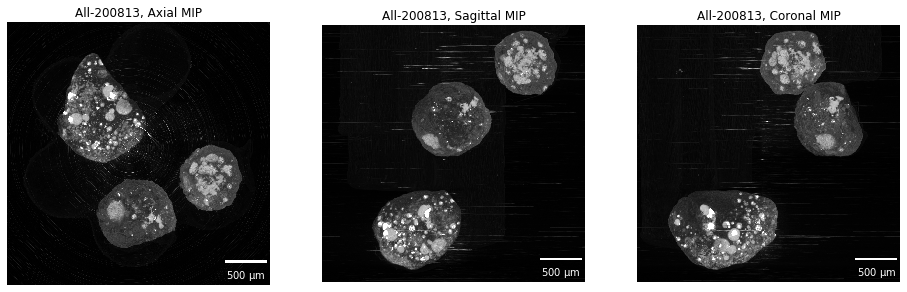

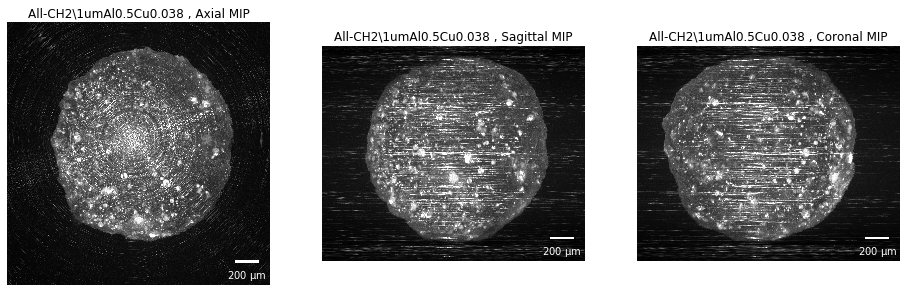

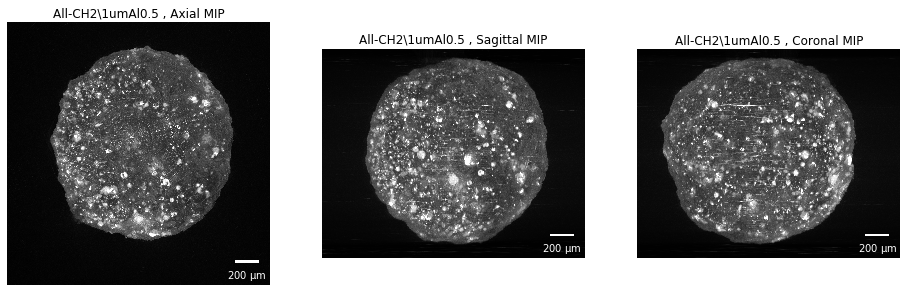

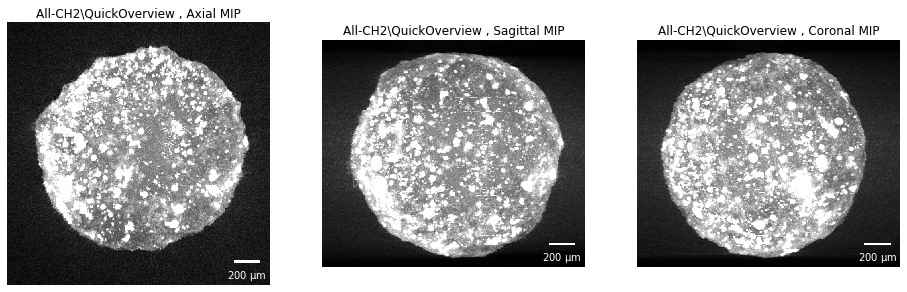

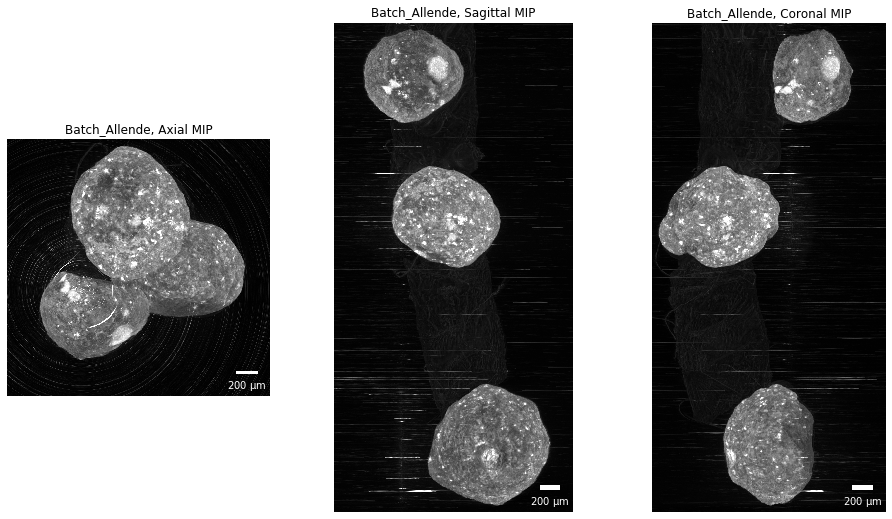

...

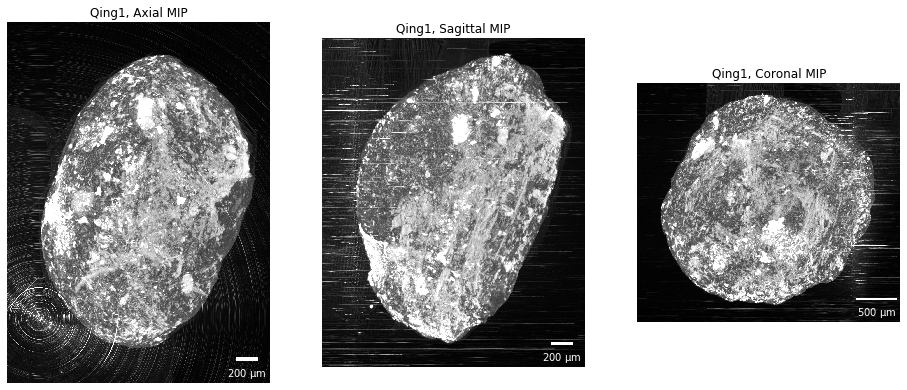

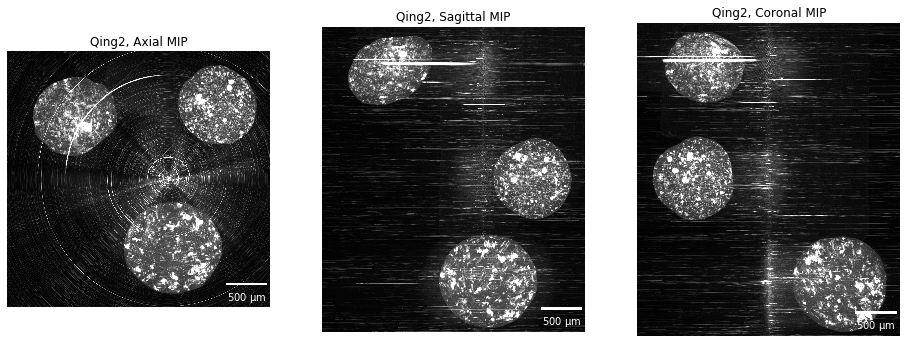

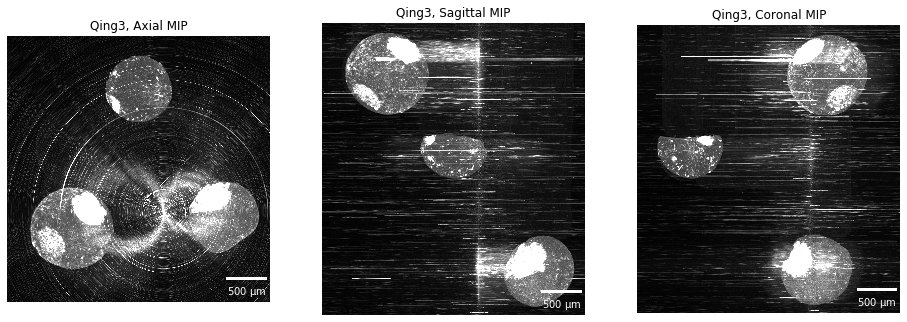

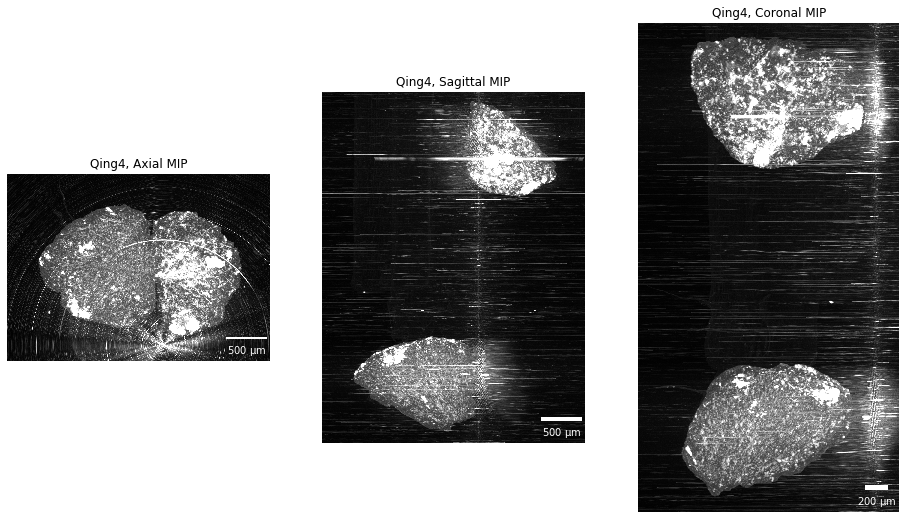

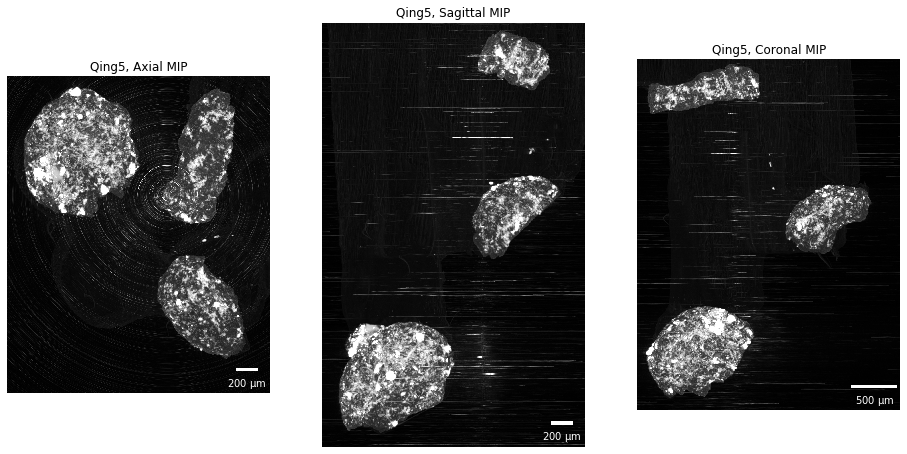

In [217]:
# Show MIP slices
for c, row in Data.iterrows():
    outputfile = os.path.join(os.path.dirname(row['LogFile']), row['Sample'] + '.MIPs.png')
    for d, direction in enumerate(directions):
        plt.subplot(1, 3, d + 1)
        plt.imshow(row['MIP_' + direction])
        plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um'))
        if row['Scan']:
            plt.title('%s , %s' % (os.path.join(row['Sample'], row['Scan']),
                                   direction + ' MIP'))
        else:
            plt.title('%s, %s' % (row['Sample'],
                                  direction + ' MIP'))
        plt.axis('off')
    if not os.path.exists(outputfile):
        plt.savefig(outputfile,
                    transparent=True,
                    bbox_inches='tight')
    plt.show()

Axial


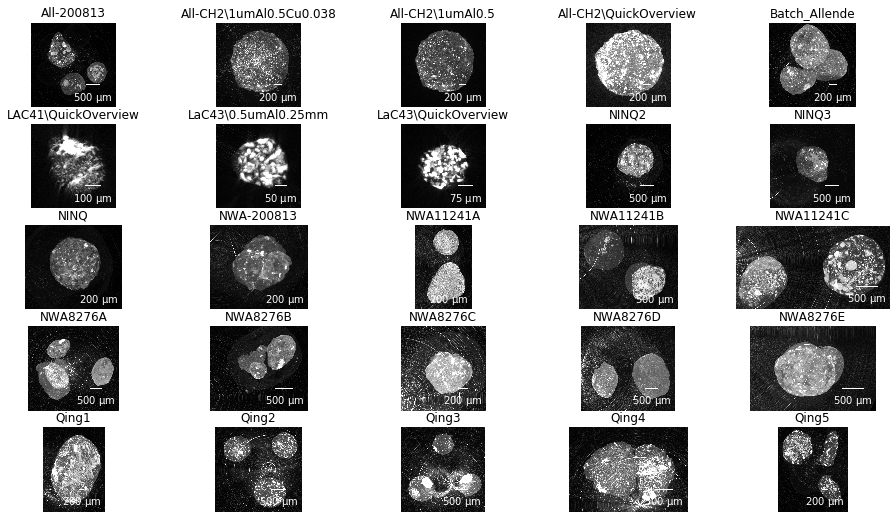

Sagittal


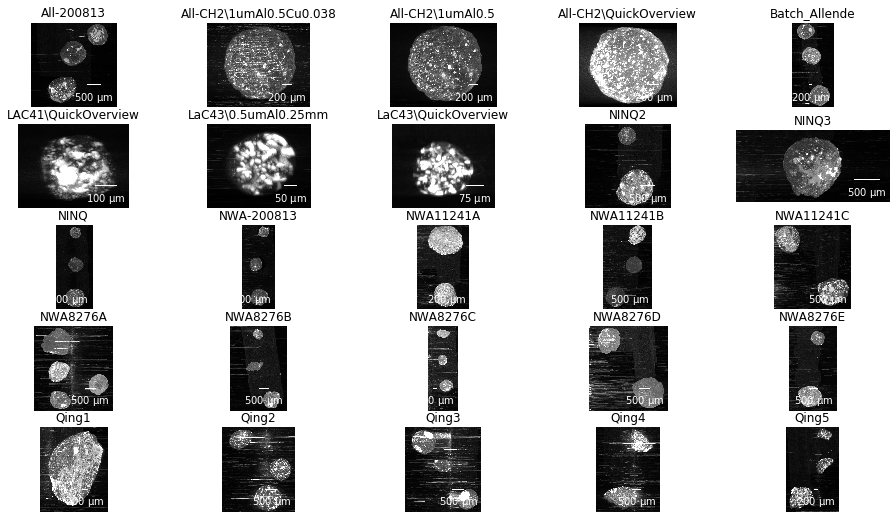

Coronal


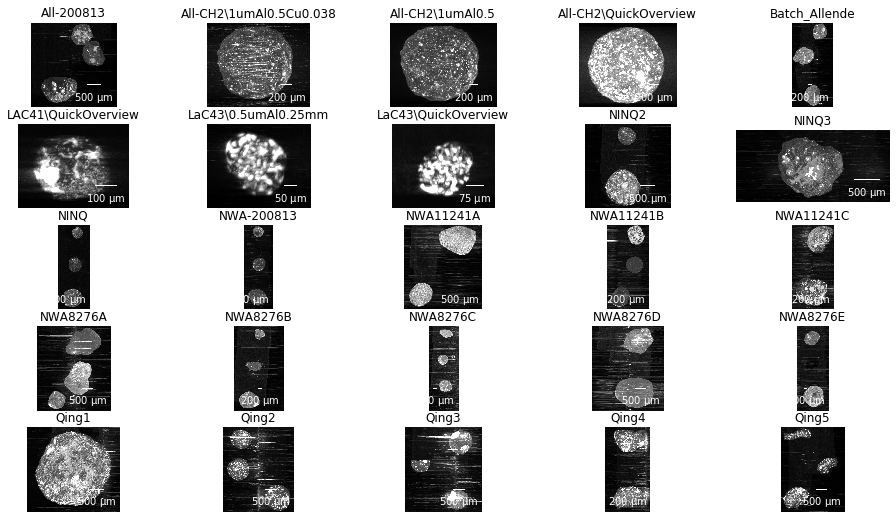

In [223]:
# Show MIPs together
for d, direction in enumerate(directions):
    print(direction)
    for c, row in Data.iterrows():
        plt.subplot(lines, numpy.ceil(len(Data) / float(lines)), c + 1)
        plt.imshow(row['MIP_' + direction])
        plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um'))
        if row['Scan']:
            plt.title('%s' % os.path.join(row['Sample'], row['Scan']))
        else:
            plt.title('%s' % row['Sample'])
        plt.axis('off')
    plt.savefig(os.path.join(Root, 'MIPs.' + direction + '.png'),
                transparent=True,
                bbox_inches='tight')
    plt.show()